# Monet Painting GAN Mini-Project
#### Introduction to Deep Learning, University of Colorado, Boulder

This project endeavors to use Generative Adversarial Networks to create artwork in the style of the impressionist painter, Claude Monet.  Can we train a machine learning model to create art in a particular style?  I have never attempted such a task before, and I look forward to the opportunity to learn new neural network architectures to accomplish this task.  To achieve this, I will leverage two deep learning architectures.  First, I will employ a Deep Convolutional Generative Adversarial Network (DCGAN).  Then, I will see whether better results can be obtained by using CycleGAN.  

The data and guidelines for this task are available on Kaggle, at the following link location:
> https://www.kaggle.com/competitions/gan-getting-started/overview

The competition submission requires the generation of 7,000-10,000 images sized 256x256.

This notebook is available on GitHub at the following location:
> https://github.com/slilly4/Monet-GANs

In [2]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
import tensorflow_addons as tfa

from keras.layers import Input
from keras.models import Model
from keras.layers import Dense, Activation, GlobalAveragePooling2D, Flatten, Dropout, BatchNormalization, Conv2D, MaxPooling2D, AveragePooling2D, add, Conv2DTranspose

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd 

AUTOTUNE = tf.data.experimental.AUTOTUNE

import glob
import os
import time

# Exporatory Data Analysis and Data Cleaning/Preparation

The first step towards tackling this problem is to identify the data which is available and to prepare that data for the deep learning models.  While both .jpeg and tfrec encoded images are available from Kaggle, I will attempt to use the images in TFRecord encoding, as these have been noted to allow for more efficient processing in TensorFlow.  TFRecords are TensorFlow's own binary storage format, and TensorFlow can use parallelize reading for better use with GPUs and TPUs.  Each TFRecord contains numerous images.   

In [6]:
for dirname, _, filenames in os.walk('/kaggle/input/gan-getting-started/photo_tfrec/'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

/kaggle/input/gan-getting-started/photo_tfrec/photo12-352.tfrec
/kaggle/input/gan-getting-started/photo_tfrec/photo11-352.tfrec
/kaggle/input/gan-getting-started/photo_tfrec/photo05-352.tfrec
/kaggle/input/gan-getting-started/photo_tfrec/photo08-352.tfrec
/kaggle/input/gan-getting-started/photo_tfrec/photo18-352.tfrec
/kaggle/input/gan-getting-started/photo_tfrec/photo06-352.tfrec
/kaggle/input/gan-getting-started/photo_tfrec/photo17-352.tfrec
/kaggle/input/gan-getting-started/photo_tfrec/photo10-352.tfrec
/kaggle/input/gan-getting-started/photo_tfrec/photo09-352.tfrec
/kaggle/input/gan-getting-started/photo_tfrec/photo15-352.tfrec
/kaggle/input/gan-getting-started/photo_tfrec/photo04-352.tfrec
/kaggle/input/gan-getting-started/photo_tfrec/photo19-350.tfrec
/kaggle/input/gan-getting-started/photo_tfrec/photo02-352.tfrec
/kaggle/input/gan-getting-started/photo_tfrec/photo16-352.tfrec
/kaggle/input/gan-getting-started/photo_tfrec/photo03-352.tfrec
/kaggle/input/gan-getting-started/photo_

In [4]:
for dirname, _, filenames in os.walk('/kaggle/input/gan-getting-started/monet_tfrec/'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

/kaggle/input/gan-getting-started/monet_tfrec/monet12-60.tfrec
/kaggle/input/gan-getting-started/monet_tfrec/monet16-60.tfrec
/kaggle/input/gan-getting-started/monet_tfrec/monet08-60.tfrec
/kaggle/input/gan-getting-started/monet_tfrec/monet04-60.tfrec
/kaggle/input/gan-getting-started/monet_tfrec/monet00-60.tfrec


As I have never used TFRecords before, I will use the code employed here: https://www.kaggle.com/code/amyjang/monet-cyclegan-tutorial/notebook to prepare the records for use in the models.  This includes adding the file locations to a list, and then decoding the images to add them to a dataset.

In [5]:
monet_dir = "/kaggle/input/gan-getting-started/monet_tfrec/"
photo_dir = "/kaggle/input/gan-getting-started/photo_tfrec/"

In [6]:
monet_filenames = tf.io.gfile.glob(monet_dir + "*.tfrec")
photo_filenames = tf.io.gfile.glob(photo_dir + "*.tfrec")

In [4]:
monet_filenames

['/kaggle/input/gan-getting-started/monet_tfrec/monet12-60.tfrec',
 '/kaggle/input/gan-getting-started/monet_tfrec/monet16-60.tfrec',
 '/kaggle/input/gan-getting-started/monet_tfrec/monet08-60.tfrec',
 '/kaggle/input/gan-getting-started/monet_tfrec/monet04-60.tfrec',
 '/kaggle/input/gan-getting-started/monet_tfrec/monet00-60.tfrec']

Additional processing takes place here in normalizing the data so that pixel values are not between 0 and 255 but -1 and 1.  This will allow for better results when running the deep learning models.

In [7]:
img_size = [256, 256]

def decode_image(image):
    image = tf.image.decode_jpeg(image, channels=3)
    image = (tf.cast(image, tf.float32) / 127.5) - 1
    image = tf.reshape(image, [*img_size, 3])
    return image

def read_tfrecord(example):
    tfrecord_format = {
        "image_name": tf.io.FixedLenFeature([], tf.string),
        "image": tf.io.FixedLenFeature([], tf.string),
        "target": tf.io.FixedLenFeature([], tf.string)
    }
    example = tf.io.parse_single_example(example, tfrecord_format)
    image = decode_image(example['image'])
    return image

def load_dataset(filenames, labeled=True, ordered=False):
    dataset = tf.data.TFRecordDataset(filenames)
    dataset = dataset.map(read_tfrecord, num_parallel_calls=AUTOTUNE)
    return dataset

In [9]:
monet_ds = load_dataset(monet_filenames, labeled=True).batch(1)
photo_ds = load_dataset(photo_filenames, labeled=True).batch(1)

In [7]:
monet_ds

<_BatchDataset element_spec=TensorSpec(shape=(None, 256, 256, 3), dtype=tf.float32, name=None)>

In [35]:
photo_ds

<_BatchDataset element_spec=TensorSpec(shape=(None, 256, 256, 3), dtype=tf.float32, name=None)>

As we can see, each image is 256x256 pixels, and there are three color channels.  This will need to be reflected in the input dimensions of the models.

Next I would like to take a look at the images.  I will iterate through the dataset and display a selection.

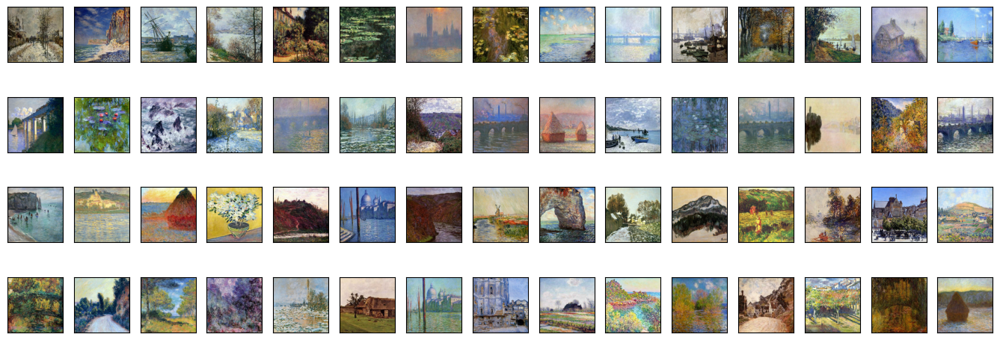

In [33]:
num_row = 4
num_col = 15
fig, axs = plt.subplots(num_row, num_col, figsize=(17, 6))
monet_pic = iter(monet_ds)
for i in range(num_row):
    for j in range(num_col):
        axs[i, j].imshow(next(monet_pic)[0] * 0.5 + 0.5)
        axs[i, j].set_xticks([])
        axs[i, j].set_yticks([])

It looks like the Monet paintings are colorful, but there are more pastel shades than vibrant ones.  Also there is a lack of defined lines.  Rather, there is more mixing of colors between components in the paintings.  I wonder whether this lack of defined lines will make it difficult for a model to mimic the style while still being able to show structures in the output.  

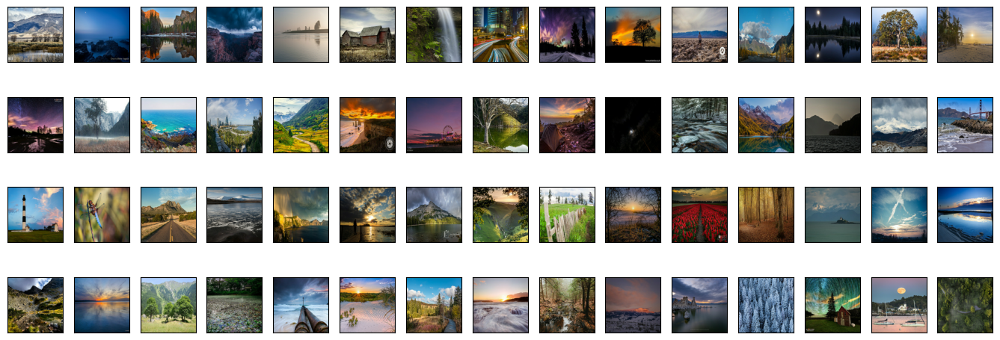

In [34]:
num_row = 4
num_col = 15
fig, axs = plt.subplots(num_row, num_col, figsize=(17, 6))
photo_pic = iter(photo_ds)
for i in range(num_row):
    for j in range(num_col):
        axs[i, j].imshow(next(photo_pic)[0] * 0.5 + 0.5)
        axs[i, j].set_xticks([])
        axs[i, j].set_yticks([])

The photographs are mostly of nature images. These do seem to generally correspond to the subject matters that Money utilizes in his paintings. 

In [49]:
photo_pic = iter(photo_ds)
pic_count = 0
for pic in photo_pic:
    pic_count += 1
    
print("Number of Photos: " + str(pic_count))

Number of Photos: 7038


In [50]:
monet_pic = iter(monet_ds)
pic_count = 0
for pic in monet_pic:
    pic_count += 1
    
print("Number of Monet Paintings: " + str(pic_count))

Number of Monet Paintings: 300


I am disappointed to see that there are only 300 Monet paintings on which to train the models.  This may prove to be a difficult task.  I would have hoped that there would be more training data available.  The larger number of photos will prove useful for style transfer techniques like CycleGAN.

# Deep Convolutional Generative Adversarial Network (DCGAN)

My first attempt at this problem will use a DCGAN neural network.  I have chosen this approach first because it has a simpler architecture, and it is similar to neural networks that I have used in the past.  The general idea is to a feed the neural network noise (with a normal distribution), and allow the neural network to learn the weights and biases which bring about an output which is most similar to the training images.  Two neural networks actually need to work in tandem to make this possible.  The Generator needs to learn how to create the images, and the Discriminator needs to learn whether the output from the Generator is a real Monet painting or an image created by the generator.  Together the two networks help each other to get better at their respective functions.  

The Generator works differently than the Convolutional networks we have seen in the past, as it performs the opposite operation.  Transposed Convolutional layers actually increase the size of the output of each layer, while using a stride of two cuts the color channels in half with each layer.  For my architecture I will start with an 8x8 layer with 256 depth (color channel), and the stride will cut the color layer in half with each layer, while the transposed convolutional layers will double the size of the layer (image size).  To make the sizes work out, I will need 5 layers to get to the right sizes for the output.  

Below is an image of what a generic DGCAN looks like.

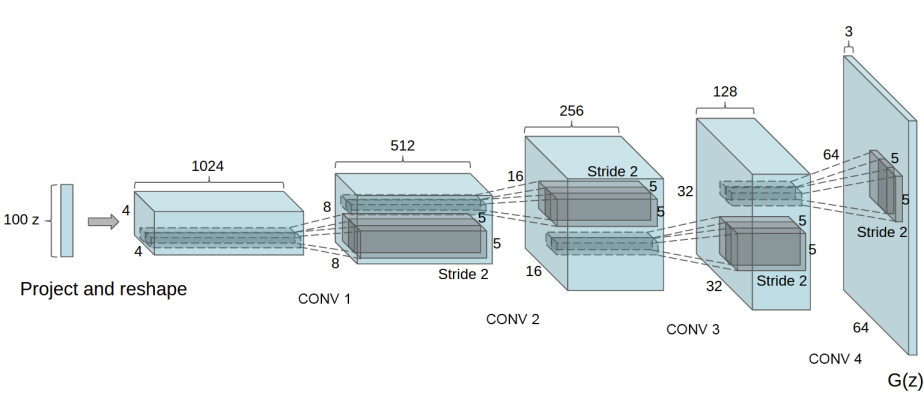

https://pytorch.org/tutorials/beginner/dcgan_faces_tutorial.html

As I only have 300 training images, I am skeptical that I will be able to generate true Monet-style images.  Looking at examples online, I often see tens of thousands of images are used for training purposes.  

Below I define my generator function.  I will also normalize each layer and use LeakyReLU for the activation function.  The course work suggested the LeakyReLu is optimal for these kinds of tasks.  

In [15]:
def make_generator_model():

    generator = tf.keras.Sequential()
    generator.add(layers.Dense(8*8*256, use_bias=False, input_shape=(100,)))
    generator.add(layers.BatchNormalization())
    generator.add(layers.LeakyReLU())
    generator.add(layers.Reshape((8, 8, 256)))

    generator.add(layers.Conv2DTranspose(256, (5, 5), strides=(2, 2), padding='same', use_bias=False))
    generator.add(layers.BatchNormalization())
    generator.add(layers.LeakyReLU())

    generator.add(layers.Conv2DTranspose(128, (5, 5), strides=(2, 2), padding='same', use_bias=False))
    generator.add(layers.BatchNormalization())
    generator.add(layers.LeakyReLU())

    generator.add(layers.Conv2DTranspose(64, (5, 5), strides=(2, 2), padding='same', use_bias=False))
    generator.add(layers.BatchNormalization())
    generator.add(layers.LeakyReLU())

    generator.add(layers.Conv2DTranspose(32, (5, 5), strides=(2, 2), padding='same', use_bias=False))
    generator.add(layers.BatchNormalization())
    generator.add(layers.LeakyReLU())

    generator.add(layers.Conv2DTranspose(3, (5, 5), strides=(2, 2), padding='same', use_bias=False, activation='tanh'))
    return generator

In [16]:
generator = make_generator_model()


In [17]:
generator.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 16384)             1638400   
                                                                 
 batch_normalization (BatchN  (None, 16384)            65536     
 ormalization)                                                   
                                                                 
 leaky_re_lu_26 (LeakyReLU)  (None, 16384)             0         
                                                                 
 reshape (Reshape)           (None, 8, 8, 256)         0         
                                                                 
 conv2d_transpose_32 (Conv2D  (None, 16, 16, 256)      1638400   
 Transpose)                                                      
                                                                 
 batch_normalization_1 (Batc  (None, 16, 16, 256)      1

There are over 4 million parameters just in the generator function.  I am concerned that with so many parameters training time may be prohibitive.

Next I will define my discriminator function.  This is similar to the image classification tasks that we have done in the the past.  Therefore, I will use regular convolutional layers.  I have also added some dropout layers.  One concern with GANs is that if the discriminator is too strong, it can prevent the generator from learning.  Some texts suggest that it may be necessary to slightly handicap the discriminator.

In [18]:
def make_discriminator_model():

    discriminator = tf.keras.Sequential()
    discriminator.add(layers.Conv2D(64, (5, 5), strides=(2, 2), padding='same', input_shape=[256, 256, 3]))
    discriminator.add(layers.LeakyReLU())
    discriminator.add(layers.Dropout(0.3))

    discriminator.add(layers.Conv2D(128, (5, 5), strides=(2, 2), padding='same'))
    discriminator.add(layers.LeakyReLU())
    discriminator.add(layers.Dropout(0.3))

    discriminator.add(layers.Conv2D(256, (5, 5), strides=(2, 2), padding='same'))
    discriminator.add(layers.LeakyReLU())
    discriminator.add(layers.Dropout(0.3))

    discriminator.add(layers.Flatten())
    discriminator.add(layers.Dense(1))

    return discriminator


In [19]:
discriminator = make_discriminator_model()


In [20]:
discriminator.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_52 (Conv2D)          (None, 128, 128, 64)      4864      
                                                                 
 leaky_re_lu_31 (LeakyReLU)  (None, 128, 128, 64)      0         
                                                                 
 dropout (Dropout)           (None, 128, 128, 64)      0         
                                                                 
 conv2d_53 (Conv2D)          (None, 64, 64, 128)       204928    
                                                                 
 leaky_re_lu_32 (LeakyReLU)  (None, 64, 64, 128)       0         
                                                                 
 dropout_1 (Dropout)         (None, 64, 64, 128)       0         
                                                                 
 conv2d_54 (Conv2D)          (None, 32, 32, 256)      

The discriminator function has over 1.2 million parameters.  That brings the total to be over 5.6 million. 

The following functions are derived from the TensorFlow website: https://www.tensorflow.org/tutorials/generative/dcgan.  They form the basis of my DCGAN model.

For a loss function, I will use binary crossentropy.  This make sense as the loss will be a measure of how similar a given generated image is to a real image.  The discriminator needs to decide on a binary basis: yes or no, is this a real Monet painting. 

In [ ]:
cross_entropy = tf.keras.losses.BinaryCrossentropy(from_logits=True)

In [27]:
def discriminator_loss(real_output, fake_output):
    real_loss = cross_entropy(tf.ones_like(real_output), real_output)
    fake_loss = cross_entropy(tf.zeros_like(fake_output), fake_output)
    total_loss = real_loss + fake_loss
    return total_loss

For real Monet paintings, 1s need to be used as the target, while for generated Images, 0s are the target. 

In [28]:
def generator_loss(fake_output):
    return cross_entropy(tf.ones_like(fake_output), fake_output)


Adam is generally considered to be one of the best optimizers, so I feel confident that it can work effectively for this task.

In [29]:
generator_optimizer = tf.keras.optimizers.Adam(1e-4)
discriminator_optimizer = tf.keras.optimizers.Adam(1e-4)


Also, since training times will be very long, it makes sense to save the model along the way in case there is a need to recover the model at the certain point.   

In [24]:
checkpoint_dir = './checkpoints'
checkpoint_prefix = os.path.join(checkpoint_dir, "ckpt")
checkpoint = tf.train.Checkpoint(generator_optimizer=generator_optimizer,
                                 discriminator_optimizer=discriminator_optimizer,
                                 generator=generator,
                                 discriminator=discriminator)


I initially did not give much thought to the batch size.  In retrospect, I should have chosen a different value here.  There are only 300 images.  A different split would have worked better.

In [30]:
batch_size = 256
noise_dim = 100

The following function from TensorFlow  will be used for the training.  GradientTape will be used to compute the gradients with respect to the loss functions.  Then those gradients will be applied to the generator, discriminator and the optimizers.

In [31]:
@tf.function
def train_step(images):
    noise = tf.random.normal([batch_size, noise_dim])

    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
        generated_images = generator(noise, training=True)

        real_output = discriminator(images, training=True)
        fake_output = discriminator(generated_images, training=True)

        gen_loss = generator_loss(fake_output)
        disc_loss = discriminator_loss(real_output, fake_output)

    gradients_of_generator = gen_tape.gradient(gen_loss, generator.trainable_variables)
    gradients_of_discriminator = disc_tape.gradient(disc_loss, discriminator.trainable_variables)

    generator_optimizer.apply_gradients(zip(gradients_of_generator, generator.trainable_variables))
    discriminator_optimizer.apply_gradients(zip(gradients_of_discriminator, discriminator.trainable_variables))

The following function brings everything together.  For each batch it calls the train_step function, and after every two epochs the model is saved.

To begin I will train for 50 epochs.  That will take about 4 hours.

In [ ]:
def train(dataset, epochs):
    for epoch in range(epochs):
    start = time.time()

    for image_batch in dataset:
        train_step(image_batch)

    if (epoch + 1) % 2 == 0:
        checkpoint.save(file_prefix = checkpoint_prefix)

    print ('Time for epoch {} is {} sec'.format(epoch + 1, time.time()-start))

In [21]:
epochs = 50

In [35]:
train(monet_ds, epochs)


2023-08-11 10:53:12.877378: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape insequential_2/dropout_4/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


Time for epoch 1 is 310.3188781738281 sec
Time for epoch 2 is 291.2892236709595 sec
Time for epoch 3 is 289.0854375362396 sec
Time for epoch 4 is 291.22418785095215 sec
Time for epoch 5 is 289.0812757015228 sec
Time for epoch 6 is 291.2008900642395 sec
Time for epoch 7 is 289.0434124469757 sec
Time for epoch 8 is 291.1288330554962 sec
Time for epoch 9 is 289.0715458393097 sec
Time for epoch 10 is 291.1281666755676 sec
Time for epoch 11 is 289.0559983253479 sec
Time for epoch 12 is 291.13818192481995 sec
Time for epoch 13 is 289.05278873443604 sec
Time for epoch 14 is 291.1296498775482 sec
Time for epoch 15 is 289.0650804042816 sec
Time for epoch 16 is 291.1294939517975 sec
Time for epoch 17 is 289.0660843849182 sec
Time for epoch 18 is 291.1212227344513 sec
Time for epoch 19 is 289.06093978881836 sec
Time for epoch 20 is 291.1401491165161 sec
Time for epoch 21 is 289.0620176792145 sec
Time for epoch 22 is 291.1507089138031 sec
Time for epoch 23 is 289.081969499588 sec
Time for epoch 24

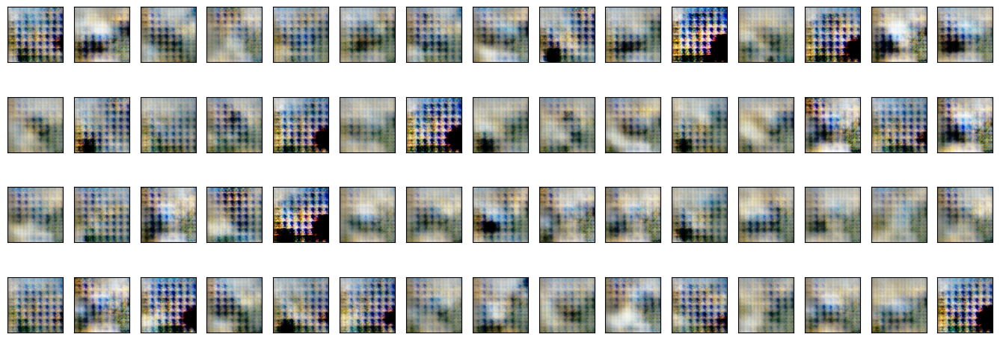

In [140]:
num_row = 4
num_col = 15
fig, axs = plt.subplots(num_row, num_col, figsize=(17, 6))
for i in range(num_row):
    for j in range(num_col):
        random_input = tf.random.normal([1, 100])
        prediction = generator(random_input, training=False)[0].numpy()
        prediction = (prediction * 127.5 + 127.5).astype(np.uint8)
        #plt.imshow(prediction)
        axs[i, j].imshow(prediction)
        axs[i, j].set_xticks([])
        axs[i, j].set_yticks([])

    

The waffle pattern is disappointing to see.  It looks like there are 8 squares across each image.  8 is 2^3 so it must be related to the architecture.  If you look past the squares, there do seem to be landscape-like shapes with different colors.  But unfortunately, it looks like there are only a few unique images.  That suggests that mode collapse is occuring.  The model has just learned a few images to produce and nothing more.

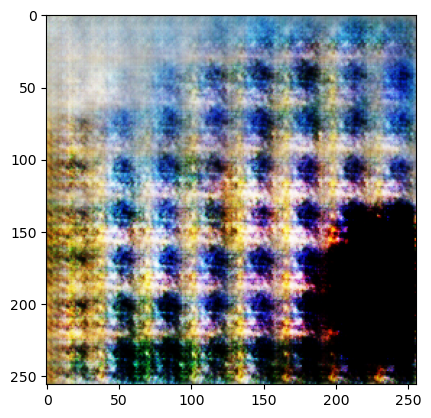

In [127]:
random_input = tf.random.normal([1, 100])
prediction = generator(random_input, training=False)[0].numpy()
prediction = (prediction * 127.5 + 127.5).astype(np.uint8)
plt.imshow(prediction)



I will continue to train the model for another 50 epochs to see whether the grid pattern can be overcome.  

In [233]:
train(monet_ds, epochs)

Time for epoch 1 is 289.0516712665558 sec
Time for epoch 2 is 291.2169508934021 sec
Time for epoch 3 is 289.07565665245056 sec
Time for epoch 4 is 291.2263503074646 sec
Time for epoch 5 is 289.0690383911133 sec
Time for epoch 6 is 291.200138092041 sec
Time for epoch 7 is 289.06504011154175 sec
Time for epoch 8 is 291.1525254249573 sec
Time for epoch 9 is 289.0956721305847 sec
Time for epoch 10 is 291.1935203075409 sec
Time for epoch 11 is 289.0679156780243 sec
Time for epoch 12 is 291.1894271373749 sec
Time for epoch 13 is 289.0963532924652 sec
Time for epoch 14 is 291.206912279129 sec
Time for epoch 15 is 289.1224031448364 sec
Time for epoch 16 is 291.21331906318665 sec
Time for epoch 17 is 289.109411239624 sec
Time for epoch 18 is 291.2009332180023 sec
Time for epoch 19 is 289.0911178588867 sec
Time for epoch 20 is 291.19456601142883 sec
Time for epoch 21 is 289.0719015598297 sec
Time for epoch 22 is 291.29929304122925 sec
Time for epoch 23 is 289.0957772731781 sec
Time for epoch 24 

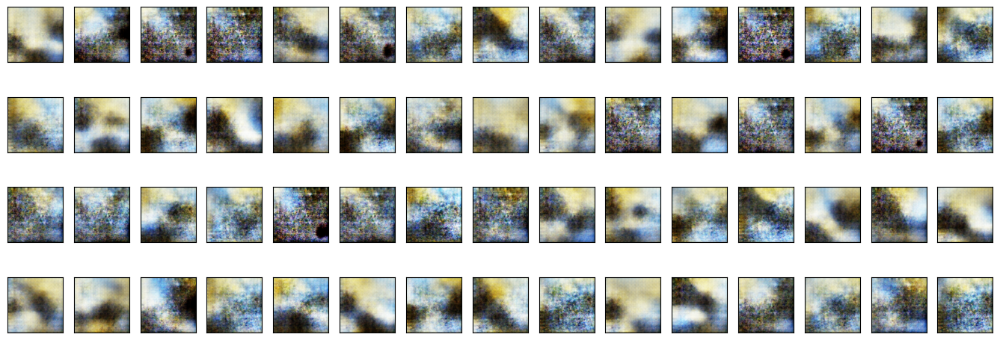

In [234]:
num_row = 4
num_col = 15
fig, axs = plt.subplots(num_row, num_col, figsize=(17, 6))
for i in range(num_row):
    for j in range(num_col):
        random_input = tf.random.normal([1, 100])
        prediction = generator(random_input, training=False)[0].numpy()
        prediction = (prediction * 127.5 + 127.5).astype(np.uint8)
        #plt.imshow(prediction)
        axs[i, j].imshow(prediction)
        axs[i, j].set_xticks([])
        axs[i, j].set_yticks([])

After 100 epochs, the grid pattern has generally been overcome.  However, mode collapse is still apparent.  The images repeat above.  There do seem to be Monet-like qualities in the images.  There are no sharp lines, and the colors blend into each other like they do in real paintings.  

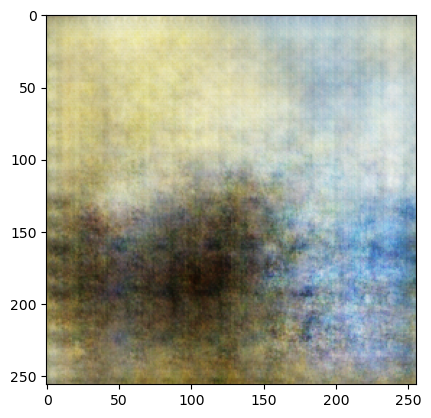

In [274]:
random_input = tf.random.normal([1, 100])
prediction = generator(random_input, training=False)[0].numpy()
prediction = (prediction * 127.5 + 127.5).astype(np.uint8)
plt.imshow(prediction)


At this point, I would like to see if we can reduce the mode collapse by weakening the discriminator.  It is probably necessary to start training from the beginning.  However, 8 more hours of training is not feasible at this point.  To make the discriminator weaker I removed a layer and I reset the weights.  It is basically starting again with the discriminator, while the generator will continue with its learned weights.  I'm not sure what impact this will have.  

In [21]:
def make_discriminator_model():

    discriminator = tf.keras.Sequential()
    discriminator.add(layers.Conv2D(64, (5, 5), strides=(2, 2), padding='same', input_shape=[256, 256, 3]))
    discriminator.add(layers.LeakyReLU())
    discriminator.add(layers.Dropout(0.3))

    discriminator.add(layers.Conv2D(128, (5, 5), strides=(2, 2), padding='same'))
    discriminator.add(layers.LeakyReLU())
    discriminator.add(layers.Dropout(0.3))

    discriminator.add(layers.Flatten())
    discriminator.add(layers.Dense(1))

    return discriminator

In [22]:
discriminator = make_discriminator_model()

In [23]:
discriminator.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_55 (Conv2D)          (None, 128, 128, 64)      4864      
                                                                 
 leaky_re_lu_34 (LeakyReLU)  (None, 128, 128, 64)      0         
                                                                 
 dropout_3 (Dropout)         (None, 128, 128, 64)      0         
                                                                 
 conv2d_56 (Conv2D)          (None, 64, 64, 128)       204928    
                                                                 
 leaky_re_lu_35 (LeakyReLU)  (None, 64, 64, 128)       0         
                                                                 
 dropout_4 (Dropout)         (None, 64, 64, 128)       0         
                                                                 
 flatten_1 (Flatten)         (None, 524288)           

In [279]:
train(monet_ds, 10)

Time for epoch 1 is 289.13973593711853 sec
Time for epoch 2 is 291.228798866272 sec
Time for epoch 3 is 289.09675788879395 sec
Time for epoch 4 is 291.21086502075195 sec
Time for epoch 5 is 289.0864477157593 sec
Time for epoch 6 is 291.21193385124207 sec
Time for epoch 7 is 289.0971920490265 sec
Time for epoch 8 is 291.2137770652771 sec
Time for epoch 9 is 289.2727813720703 sec
Time for epoch 10 is 291.02502727508545 sec


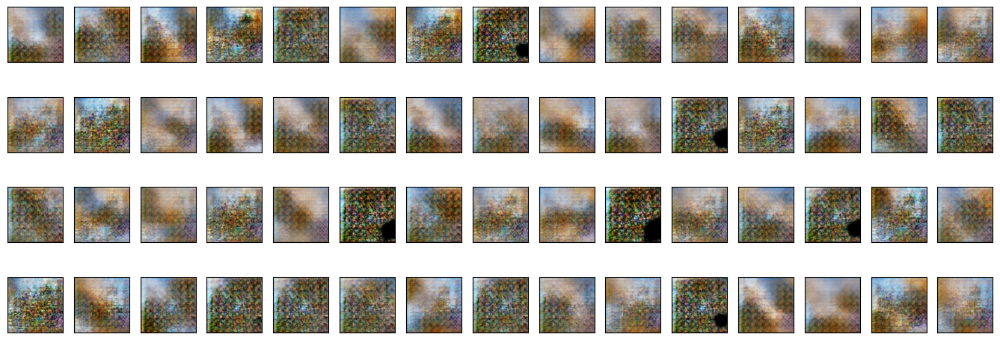

In [21]:
num_row = 4
num_col = 15
fig, axs = plt.subplots(num_row, num_col, figsize=(17, 6))
for i in range(num_row):
    for j in range(num_col):
        random_input = tf.random.normal([1, 100])
        prediction = generator(random_input, training=False)[0].numpy()
        prediction = (prediction * 127.5 + 127.5).astype(np.uint8)
        #plt.imshow(prediction)
        axs[i, j].imshow(prediction)
        axs[i, j].set_xticks([])
        axs[i, j].set_yticks([])

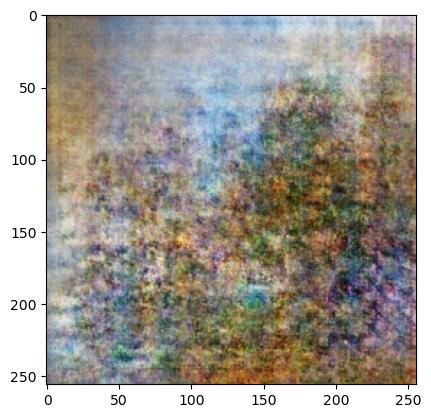

In [31]:
random_input = tf.random.normal([1, 100])
prediction = generator(random_input, training=False)[0].numpy()
prediction = (prediction * 127.5 + 127.5).astype(np.uint8)
plt.imshow(prediction)

The mode collapse has not improved after 10 additional epochs.  However, there are more colors present in the images.  I do feel there is something Monet-like in the colors.  However, no structures are present.  I just don't think there is enough data for the model to learn. 

Next, I would like to see whether increasing the size of the noise input can address the mode collapse problem.  I have increased the size to 200.

In [24]:
def make_generator_model():

    generator = tf.keras.Sequential()
    generator.add(layers.Dense(8*8*256, use_bias=False, input_shape=(200,)))
    generator.add(layers.BatchNormalization())
    generator.add(layers.LeakyReLU())
    generator.add(layers.Reshape((8, 8, 256)))

    generator.add(layers.Conv2DTranspose(256, (5, 5), strides=(2, 2), padding='same', use_bias=False))
    generator.add(layers.BatchNormalization())
    generator.add(layers.LeakyReLU())

    generator.add(layers.Conv2DTranspose(128, (5, 5), strides=(2, 2), padding='same', use_bias=False))
    generator.add(layers.BatchNormalization())
    generator.add(layers.LeakyReLU())

    generator.add(layers.Conv2DTranspose(64, (5, 5), strides=(2, 2), padding='same', use_bias=False))
    generator.add(layers.BatchNormalization())
    generator.add(layers.LeakyReLU())

    generator.add(layers.Conv2DTranspose(32, (5, 5), strides=(2, 2), padding='same', use_bias=False))
    generator.add(layers.BatchNormalization())
    generator.add(layers.LeakyReLU())

    generator.add(layers.Conv2DTranspose(3, (5, 5), strides=(2, 2), padding='same', use_bias=False, activation='tanh'))
    return generator

In [25]:
generator = make_generator_model()

In [47]:
generator.summary()

Model: "sequential_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_6 (Dense)             (None, 16384)             3276800   
                                                                 
 batch_normalization_25 (Bat  (None, 16384)            65536     
 chNormalization)                                                
                                                                 
 leaky_re_lu_28 (LeakyReLU)  (None, 16384)             0         
                                                                 
 reshape_5 (Reshape)         (None, 8, 8, 256)         0         
                                                                 
 conv2d_transpose_25 (Conv2D  (None, 16, 16, 256)      1638400   
 Transpose)                                                      
                                                                 
 batch_normalization_26 (Bat  (None, 16, 16, 256)     

I will use the same discriminator architecture as before.

In [22]:
def make_discriminator_model():

    discriminator = tf.keras.Sequential()
    discriminator.add(layers.Conv2D(64, (5, 5), strides=(2, 2), padding='same', input_shape=[256, 256, 3]))
    discriminator.add(layers.LeakyReLU())
    discriminator.add(layers.Dropout(0.3))

    discriminator.add(layers.Conv2D(128, (5, 5), strides=(2, 2), padding='same'))
    discriminator.add(layers.LeakyReLU())
    discriminator.add(layers.Dropout(0.3))

    discriminator.add(layers.Conv2D(256, (5, 5), strides=(2, 2), padding='same'))
    discriminator.add(layers.LeakyReLU())
    discriminator.add(layers.Dropout(0.3))

    discriminator.add(layers.Flatten())
    discriminator.add(layers.Dense(1))

    return discriminator

In [23]:
discriminator = make_discriminator_model()

In [33]:
checkpoint_dir = './checkpoints2'
checkpoint_prefix = os.path.join(checkpoint_dir, "ckpt")
checkpoint = tf.train.Checkpoint(generator_optimizer=generator_optimizer,
                                 discriminator_optimizer=discriminator_optimizer,
                                 generator=generator,
                                 discriminator=discriminator)

I picked 200 for the noise size; however, in retrospect this was a bad decision.  100 is a square number.  200 is not.  I should have picked 225 or 400.  

In [77]:
noise_dim = 200
train(monet_ds, 10)

2023-08-11 22:42:18.123089: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape insequential_10/dropout_7/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


Time for epoch 1 is 295.74053716659546 sec
Time for epoch 2 is 291.26769733428955 sec
Time for epoch 3 is 289.0010497570038 sec
Time for epoch 4 is 291.16793179512024 sec
Time for epoch 5 is 289.04205346107483 sec
Time for epoch 6 is 291.1971218585968 sec
Time for epoch 7 is 289.06445026397705 sec
Time for epoch 8 is 291.22053360939026 sec
Time for epoch 9 is 289.01247119903564 sec
Time for epoch 10 is 291.19616961479187 sec


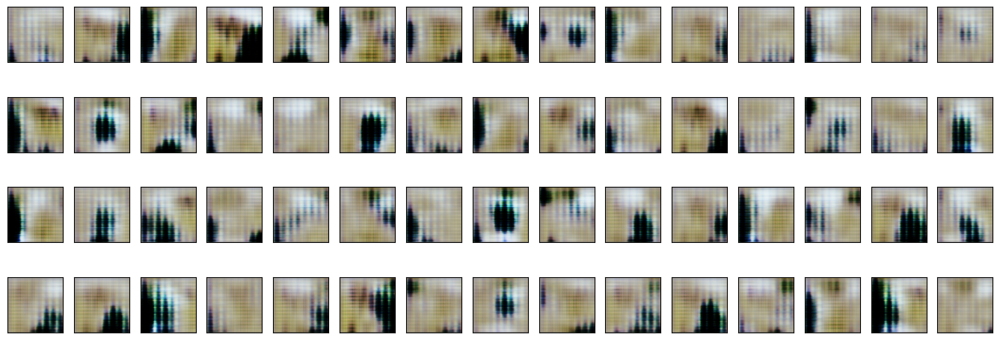

In [79]:
num_row = 4
num_col = 15
fig, axs = plt.subplots(num_row, num_col, figsize=(17, 6))
for i in range(num_row):
    for j in range(num_col):
        random_input = tf.random.normal([1, 200])
        prediction = generator(random_input, training=False)[0].numpy()
        prediction = (prediction * 127.5 + 127.5).astype(np.uint8)
        #plt.imshow(prediction)
        axs[i, j].imshow(prediction)
        axs[i, j].set_xticks([])
        axs[i, j].set_yticks([])

The training results were very disappointing, and they did not improve even after 100 epochs. 

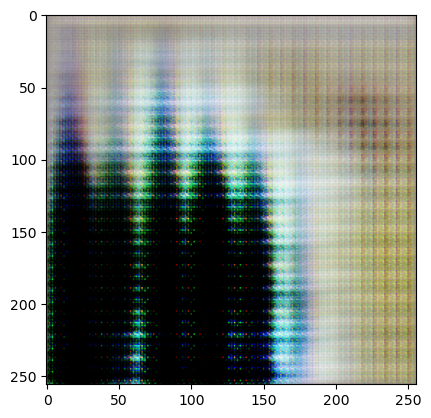

In [90]:
random_input = tf.random.normal([1, 200])
prediction = generator(random_input, training=False)[0].numpy()
prediction = (prediction * 127.5 + 127.5).astype(np.uint8)
plt.imshow(prediction)

In [40]:
noise_dim = 200
train(monet_ds, 100)


2023-08-12 01:24:18.230607: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] layout failed: INVALID_ARGUMENT: Size of values 0 does not match size of permutation 4 @ fanin shape insequential_2/dropout_3/dropout/SelectV2-2-TransposeNHWCToNCHW-LayoutOptimizer


Time for epoch 1 is 293.5119037628174 sec
Time for epoch 2 is 291.0078184604645 sec
Time for epoch 3 is 288.658474445343 sec
Time for epoch 4 is 290.9140365123749 sec
Time for epoch 5 is 288.7019736766815 sec
Time for epoch 6 is 290.86132979393005 sec
Time for epoch 7 is 288.6788284778595 sec
Time for epoch 8 is 290.90288853645325 sec
Time for epoch 9 is 288.6765990257263 sec
Time for epoch 10 is 290.9081611633301 sec
Time for epoch 11 is 288.6883006095886 sec
Time for epoch 12 is 290.92036533355713 sec
Time for epoch 13 is 288.69715571403503 sec
Time for epoch 14 is 290.89315485954285 sec
Time for epoch 15 is 288.6603043079376 sec
Time for epoch 16 is 290.90921425819397 sec
Time for epoch 17 is 288.65995502471924 sec
Time for epoch 18 is 290.89843821525574 sec
Time for epoch 19 is 288.67829632759094 sec
Time for epoch 20 is 291.0382659435272 sec
Time for epoch 21 is 288.68762016296387 sec
Time for epoch 22 is 290.89311027526855 sec
Time for epoch 23 is 288.6676826477051 sec
Time for e

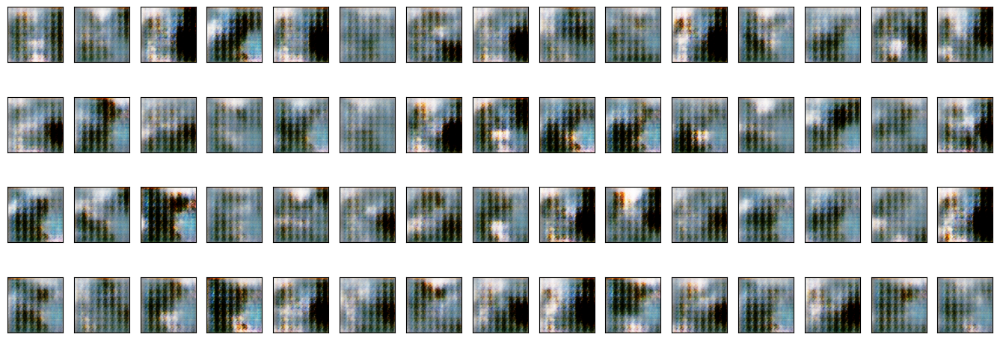

In [50]:
num_row = 4
num_col = 15
fig, axs = plt.subplots(num_row, num_col, figsize=(17, 6))
for i in range(num_row):
    for j in range(num_col):
        random_input = tf.random.normal([1, 200])
        prediction = generator(random_input, training=False)[0].numpy()
        prediction = (prediction * 127.5 + 127.5).astype(np.uint8)
        #plt.imshow(prediction)
        axs[i, j].imshow(prediction)
        axs[i, j].set_xticks([])
        axs[i, j].set_yticks([])

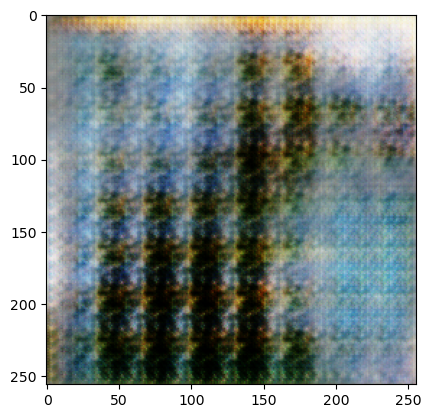

In [51]:
random_input = tf.random.normal([1, 200])
prediction = generator(random_input, training=False)[0].numpy()
prediction = (prediction * 127.5 + 127.5).astype(np.uint8)
plt.imshow(prediction)

I'm guessing that the input messed with the generator.  It likely needed a square number.  After spending many hours researching and training DCGAN models, I believe that it's best to turn to a different approach.    

# CycleGAN

While CycleGAN also has generative adversarial networks at its core, it functions in a much different manner.  Instead of using noise as an input to the model, we will leverage images as inputs for two GANs:  For one we will input monet paintings and use GAN architecture to attempt to transform them into photo-like images.  Another will take photos and attempt to transform them into Monet-like images.  These two GANs will work in cycles together, transforming images and transforming them back.  The result will be two generators, and for our purposes one will be trained to take images and make them Monet-like.  This is known as style-transfer.  

The following image shows an overview of what this process looks like.  

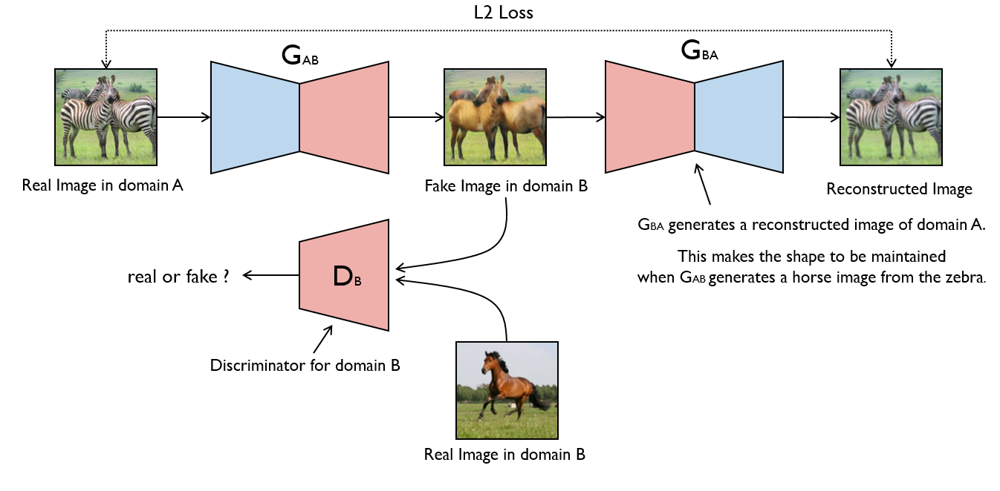

https://blog.jaysinha.me/train-your-first-cyclegan-for-image-to-image-translation/

The following is my first attempt at creating a generator for CycleGAN.  It is based heavily on the example found here: https://www.kaggle.com/code/amyjang/monet-cyclegan-tutorial/notebook.

The 256x256 image acts as an input, and with each layer we reduce the image size by half.  With a stride of 2, 8 layers are needed to reduce the size to 1x1.  Then we will build the image back to 256x256 through 8 layers using the transpose operation (like we used with DCGAN).  Since this is a very deep neural network, skip layers have been added in.  This should help prevent a flat gradient.  

In [3]:
def Generator():
    initializer = tf.random_normal_initializer(0., 0.02)
    
    inputs = layers.Input(shape=[256, 256, 3])
    down_1 = Conv2D(64, 4, strides=2, padding='same', kernel_initializer=initializer, use_bias=False)(inputs)
    down_2 = Conv2D(128, 4, strides=2, padding='same', kernel_initializer=initializer, use_bias=False)(down_1)
    down_2_2 = Conv2D(256, 4, strides=2, padding='same', kernel_initializer=initializer, use_bias=False)(down_2)    
    down_3 = Conv2D(512, 4, strides=2, padding='same', kernel_initializer=initializer, use_bias=False)(down_2_2)
    down_4 = Conv2D(512, 4, strides=2, padding='same', kernel_initializer=initializer, use_bias=False)(down_3)
    down_5 = Conv2D(512, 4, strides=2, padding='same', kernel_initializer=initializer, use_bias=False)(down_4)
    down_6 = Conv2D(512, 4, strides=2, padding='same', kernel_initializer=initializer, use_bias=False)(down_5)
    down_7 = Conv2D(512, 4, strides=2, padding='same', kernel_initializer=initializer, use_bias=False)(down_6)    
    up_1 = Conv2DTranspose(512, 4, strides=2, padding='same', kernel_initializer=initializer, use_bias=False)(down_7)
    up_2 = add([Conv2DTranspose(512, 4, strides=2, padding='same', kernel_initializer=initializer, use_bias=False)(up_1), down_5])
    up_3 = add([Conv2DTranspose(512, 4, strides=2, padding='same', kernel_initializer=initializer, use_bias=False)(up_2), down_4])
    up_4 = add([Conv2DTranspose(512, 4, strides=2, padding='same', kernel_initializer=initializer, use_bias=False)(up_3), down_3])
    up_5 = add([Conv2DTranspose(256, 4, strides=2, padding='same', kernel_initializer=initializer, use_bias=False)(up_4), down_2_2])
    up_6 = add([Conv2DTranspose(128, 4, strides=2, padding='same', kernel_initializer=initializer, use_bias=False)(up_5), down_2])
    up_7 = add([Conv2DTranspose(64, 4, strides=2, padding='same', kernel_initializer=initializer, use_bias=False)(up_6), down_1])

    outputs = add([Conv2DTranspose(3, 4, strides=2, padding='same', kernel_initializer=initializer, activation='tanh')(up_7), inputs])

    return Model(inputs=inputs, outputs=outputs)


Then we create a discriminator.  This again is largely based on the examples found here: https://www.kaggle.com/code/amyjang/monet-cyclegan-tutorial/notebook.

The discriminator is basically a classifier, so we use convolutional layers as in previous projects in this course.  

In [4]:
def Discriminator():
    initializer = tf.random_normal_initializer(0., 0.02)
    gamma_init = keras.initializers.RandomNormal(mean=0.0, stddev=0.02)

    inputs = layers.Input(shape=[256, 256, 3], name='input_image')
    down_1 = Conv2D(64, 4, strides=2, padding='same', kernel_initializer=initializer, use_bias=False)(inputs)
    down_2 = Conv2D(128, 4, strides=2, padding='same', kernel_initializer=initializer, use_bias=False)(down_1)
    down_3 = Conv2D(256, 4, strides=2, padding='same', kernel_initializer=initializer, use_bias=False)(down_2)
    padding = layers.ZeroPadding2D()(down_3)
    conv2D = layers.Conv2D(512, 4, strides=1, kernel_initializer=initializer,use_bias=False)(padding) 
    norm1 = tfa.layers.InstanceNormalization(gamma_initializer=gamma_init)(conv2D)
    leaky_relu = layers.LeakyReLU()(norm1)
    padding2 = layers.ZeroPadding2D()(leaky_relu)
    outputs = layers.Conv2D(1, 4, strides=1, kernel_initializer=initializer)(padding2) 

    return Model(inputs=inputs, outputs=outputs)



Since there are a lot of calculations, we will try to use a TPU to speed up the operations.

In [12]:
try:
    tpu = tf.distribute.cluster_resolver.TPUClusterResolver()
    tf.config.experimental_connect_to_cluster(tpu)
    tf.tpu.experimental.initialize_tpu_system(tpu)
    strategy = tf.distribute.experimental.TPUStrategy(tpu)
except:
    strategy = tf.distribute.get_strategy()


INFO:tensorflow:Deallocate tpu buffers before initializing tpu system.
INFO:tensorflow:Initializing the TPU system: local
INFO:tensorflow:Finished initializing TPU system.


INFO:tensorflow:Found TPU system:


INFO:tensorflow:Found TPU system:


INFO:tensorflow:*** Num TPU Cores: 8


INFO:tensorflow:*** Num TPU Cores: 8


INFO:tensorflow:*** Num TPU Workers: 1


INFO:tensorflow:*** Num TPU Workers: 1


INFO:tensorflow:*** Num TPU Cores Per Worker: 8


INFO:tensorflow:*** Num TPU Cores Per Worker: 8


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:localhost/replica:0/task:0/device:CPU:0, CPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:localhost/replica:0/task:0/device:CPU:0, CPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:localhost/replica:0/task:0/device:TPU:0, TPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:localhost/replica:0/task:0/device:TPU:0, TPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:localhost/replica:0/task:0/device:TPU:1, TPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:localhost/replica:0/task:0/device:TPU:1, TPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:localhost/replica:0/task:0/device:TPU:2, TPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:localhost/replica:0/task:0/device:TPU:2, TPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:localhost/replica:0/task:0/device:TPU:3, TPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:localhost/replica:0/task:0/device:TPU:3, TPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:localhost/replica:0/task:0/device:TPU:4, TPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:localhost/replica:0/task:0/device:TPU:4, TPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:localhost/replica:0/task:0/device:TPU:5, TPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:localhost/replica:0/task:0/device:TPU:5, TPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:localhost/replica:0/task:0/device:TPU:6, TPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:localhost/replica:0/task:0/device:TPU:6, TPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:localhost/replica:0/task:0/device:TPU:7, TPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:localhost/replica:0/task:0/device:TPU:7, TPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:localhost/replica:0/task:0/device:TPU_SYSTEM:0, TPU_SYSTEM, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:localhost/replica:0/task:0/device:TPU_SYSTEM:0, TPU_SYSTEM, 0, 0)


Since the model works in a cycle, we need two sets of generators and discriminators.

In [7]:
with strategy.scope():
    monet_generator = Generator() 
    photo_generator = Generator() 

    monet_discriminator = Discriminator() 
    photo_discriminator = Discriminator() 

In [8]:
monet_generator.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 256, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d (Conv2D)                (None, 128, 128, 64  3072        ['input_1[0][0]']                
                                )                                                                 
                                                                                                  
 conv2d_1 (Conv2D)              (None, 64, 64, 128)  131072      ['conv2d[0][0]']                 
                                                                                              

In [9]:
monet_discriminator.summary()

Model: "model_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_image (InputLayer)    [(None, 256, 256, 3)]     0         
                                                                 
 conv2d_16 (Conv2D)          (None, 128, 128, 64)      3072      
                                                                 
 conv2d_17 (Conv2D)          (None, 64, 64, 128)       131072    
                                                                 
 conv2d_18 (Conv2D)          (None, 32, 32, 256)       524288    
                                                                 
 zero_padding2d (ZeroPadding  (None, 34, 34, 256)      0         
 2D)                                                             
                                                                 
 conv2d_19 (Conv2D)          (None, 31, 31, 512)       2097152   
                                                           

There are over 42 million parameters just for one discriminator and generator pair.  That means 84 million parameters are needed for the entire model.  

Since there is not an out of the box keras model will CycleGAN, a custom model architecture needs to be used.  Building one is outside of the scope of this course, so the following code has been copied from https://www.kaggle.com/code/amyjang/monet-cyclegan-tutorial/notebook.

The first functions set the variables for the CycleGAN class.  Then in the train_step function, the generators are used in a cycle to convert a photo into a Monet-like image, and then back into a photo-like image.  Also the reverse is done to convert a Monet paining into a photo-like image and then back into a Monet-like image.  Then the discriminators check the loss based on the true Monet paintings and photos.  The gradients are calculated with the Gradient tape function, and then they are applied to the discriminators and generators.  

In [14]:
class CycleGan(keras.Model):
    def __init__(self, monet_generator, photo_generator, monet_discriminator, photo_discriminator, lambda_cycle=10,
    ):
        super(CycleGan, self).__init__()
        self.m_gen = monet_generator
        self.p_gen = photo_generator
        self.m_disc = monet_discriminator
        self.p_disc = photo_discriminator
        self.lambda_cycle = lambda_cycle
        
    def compile(self, m_gen_optimizer, p_gen_optimizer, m_disc_optimizer, p_disc_optimizer, gen_loss_fn, disc_loss_fn, cycle_loss_fn, identity_loss_fn):
        super(CycleGan, self).compile()
        self.m_gen_optimizer = m_gen_optimizer
        self.p_gen_optimizer = p_gen_optimizer
        self.m_disc_optimizer = m_disc_optimizer
        self.p_disc_optimizer = p_disc_optimizer
        self.gen_loss_fn = gen_loss_fn
        self.disc_loss_fn = disc_loss_fn
        self.cycle_loss_fn = cycle_loss_fn
        self.identity_loss_fn = identity_loss_fn
        
    def train_step(self, batch_data):
        real_monet, real_photo = batch_data
        
        with tf.GradientTape(persistent=True) as tape:
            # photo to monet back to photo
            fake_monet = self.m_gen(real_photo, training=True)
            cycled_photo = self.p_gen(fake_monet, training=True)

            # monet to photo back to monet
            fake_photo = self.p_gen(real_monet, training=True)
            cycled_monet = self.m_gen(fake_photo, training=True)

            # generating itself
            same_monet = self.m_gen(real_monet, training=True)
            same_photo = self.p_gen(real_photo, training=True)

            # discriminator used to check, inputing real images
            disc_real_monet = self.m_disc(real_monet, training=True)
            disc_real_photo = self.p_disc(real_photo, training=True)

            # discriminator used to check, inputing fake images
            disc_fake_monet = self.m_disc(fake_monet, training=True)
            disc_fake_photo = self.p_disc(fake_photo, training=True)

            # evaluates generator loss
            monet_gen_loss = self.gen_loss_fn(disc_fake_monet)
            photo_gen_loss = self.gen_loss_fn(disc_fake_photo)

            # evaluates total cycle consistency loss
            total_cycle_loss = self.cycle_loss_fn(real_monet, cycled_monet, self.lambda_cycle) + self.cycle_loss_fn(real_photo, cycled_photo, self.lambda_cycle)

            # evaluates total generator loss
            total_monet_gen_loss = monet_gen_loss + total_cycle_loss + self.identity_loss_fn(real_monet, same_monet, self.lambda_cycle)
            total_photo_gen_loss = photo_gen_loss + total_cycle_loss + self.identity_loss_fn(real_photo, same_photo, self.lambda_cycle)

            # evaluates discriminator loss
            monet_disc_loss = self.disc_loss_fn(disc_real_monet, disc_fake_monet)
            photo_disc_loss = self.disc_loss_fn(disc_real_photo, disc_fake_photo)

        # Calculate the gradients for generator and discriminator
        monet_generator_gradients = tape.gradient(total_monet_gen_loss, self.m_gen.trainable_variables)
        photo_generator_gradients = tape.gradient(total_photo_gen_loss, self.p_gen.trainable_variables)
        monet_discriminator_gradients = tape.gradient(monet_disc_loss, self.m_disc.trainable_variables)
        photo_discriminator_gradients = tape.gradient(photo_disc_loss, self.p_disc.trainable_variables)

        # Apply the gradients to the optimizer
        self.m_gen_optimizer.apply_gradients(zip(monet_generator_gradients, self.m_gen.trainable_variables))
        self.p_gen_optimizer.apply_gradients(zip(photo_generator_gradients, self.p_gen.trainable_variables))
        self.m_disc_optimizer.apply_gradients(zip(monet_discriminator_gradients, self.m_disc.trainable_variables))
        self.p_disc_optimizer.apply_gradients(zip(photo_discriminator_gradients, self.p_disc.trainable_variables))
        
      
        return {
            "monet_gen_loss": total_monet_gen_loss,
            "photo_gen_loss": total_photo_gen_loss,
            "monet_disc_loss": monet_disc_loss,
            "photo_disc_loss": photo_disc_loss
        }

The following functions are used to calculate the loss.  Binary Crossentropy is ideal as this is a binary classification task:  Is a given image a Monet painting or not?  Or is a given image a photo or not? 1 in the target for the true images, while 0 is the target for the fake ones.

In [15]:
with strategy.scope():
    def discriminator_loss(real, generated):
        real_loss = tf.keras.losses.BinaryCrossentropy(from_logits=True, reduction=tf.keras.losses.Reduction.NONE)(tf.ones_like(real), real)
        generated_loss = tf.keras.losses.BinaryCrossentropy(from_logits=True, reduction=tf.keras.losses.Reduction.NONE)(tf.zeros_like(generated), generated)
        total_disc_loss = real_loss + generated_loss
        return total_disc_loss * 0.5

In [16]:
with strategy.scope():
    def generator_loss(generated):
        return tf.keras.losses.BinaryCrossentropy(from_logits=True, reduction=tf.keras.losses.Reduction.NONE)(tf.ones_like(generated), generated)

In [17]:
with strategy.scope():
    def calc_cycle_loss(real_image, cycled_image, LAMBDA):
        loss1 = tf.reduce_mean(tf.abs(real_image - cycled_image))
        return LAMBDA * loss1

In [18]:
with strategy.scope():
    def identity_loss(real_image, same_image, LAMBDA):
        loss = tf.reduce_mean(tf.abs(real_image - same_image))
        return LAMBDA * 0.5 * loss

Adam had consistently been found to be an ideal optimzer, so I trust that it will work effectively here.

In [19]:
with strategy.scope():
    monet_generator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
    photo_generator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
    monet_discriminator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
    photo_discriminator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)

Also, with so many parameters, I will attempt to save the model regularly so that the model can be recovered if there are any problems.  

In [20]:
checkpoint_dir_monet = './checkpoints_cycle_monet'
checkpoint_prefix_monet = os.path.join(checkpoint_dir_monet, "ckpt")
checkpoint_monet = tf.train.Checkpoint(generator_optimizer=monet_generator_optimizer,
                                 discriminator_optimizer=monet_discriminator_optimizer,
                                 generator=monet_generator,
                                 discriminator=monet_discriminator)

checkpoint_dir_photo = './checkpoints_cycle_photo'
checkpoint_prefix_photo = os.path.join(checkpoint_dir_photo, "ckpt")
checkpoint_photo = tf.train.Checkpoint(generator_optimizer=photo_generator_optimizer,
                                 discriminator_optimizer=photo_discriminator_optimizer,
                                 generator=photo_generator,
                                 discriminator=photo_discriminator)



In [22]:
with strategy.scope():
    cycle_gan_model = CycleGan(
        monet_generator, photo_generator, monet_discriminator, photo_discriminator
    )

    cycle_gan_model.compile(
        m_gen_optimizer = monet_generator_optimizer,
        p_gen_optimizer = photo_generator_optimizer,
        m_disc_optimizer = monet_discriminator_optimizer,
        p_disc_optimizer = photo_discriminator_optimizer,
        gen_loss_fn = generator_loss,
        disc_loss_fn = discriminator_loss,
        cycle_loss_fn = calc_cycle_loss,
        identity_loss_fn = identity_loss
    )

I will begin with 25 epochs of training, and see how the model performs at that point.  

In [20]:
cycle_gan_model.fit(
    tf.data.Dataset.zip((monet_ds, photo_ds)),
    epochs=25
)

checkpoint_monet.write(file_prefix = checkpoint_prefix_monet)
checkpoint_photo.write(file_prefix = checkpoint_prefix_photo)

Epoch 1/25


2023-08-12 18:58:25.885915: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] model_pruner failed: INVALID_ARGUMENT: Graph does not contain terminal node AssignAddVariableOp.
2023-08-12 18:58:26.245947: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] model_pruner failed: INVALID_ARGUMENT: Graph does not contain terminal node AssignAddVariableOp.


300/300 [==============================] - 85s 102ms/step - monet_gen_loss: 0.9096 - photo_gen_loss: 0.9121 - monet_disc_loss: 0.6313 - photo_disc_loss: 0.6298
Epoch 2/25
300/300 [==============================] - 30s 100ms/step - monet_gen_loss: 27.0215 - photo_gen_loss: 26.9471 - monet_disc_loss: 0.2363 - photo_disc_loss: 0.2058
Epoch 3/25
300/300 [==============================] - 30s 100ms/step - monet_gen_loss: 28.6524 - photo_gen_loss: 28.5792 - monet_disc_loss: 0.0662 - photo_disc_loss: 0.0456
Epoch 4/25
300/300 [==============================] - 30s 100ms/step - monet_gen_loss: 28.3258 - photo_gen_loss: 29.1313 - monet_disc_loss: 0.0588 - photo_disc_loss: 0.0212
Epoch 5/25
300/300 [==============================] - 30s 101ms/step - monet_gen_loss: 29.2461 - photo_gen_loss: 29.1138 - monet_disc_loss: 0.0312 - photo_disc_loss: 0.1317
Epoch 6/25
300/300 [==============================] - 30s 101ms/step - monet_gen_loss: 28.5459 - photo_gen_loss: 29.1475 - monet_disc_loss: 0.1950 -

'./checkpoints_cycle_photo/ckpt'

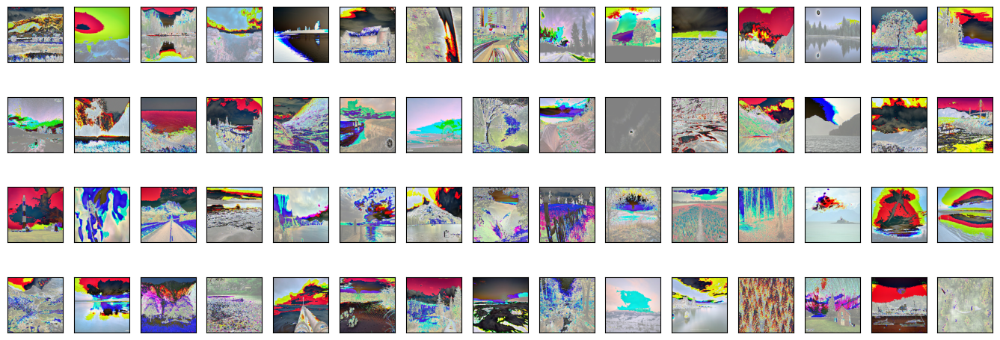

In [22]:
num_row = 4
num_col = 15
fig, axs = plt.subplots(num_row, num_col, figsize=(17, 6))
photo_pic = iter(photo_ds)
for i in range(num_row):
    for j in range(num_col):
        prediction = monet_generator(next(photo_pic), training=False)[0].numpy()
        prediction = (prediction * 127.5 + 127.5).astype(np.uint8)
        axs[i, j].imshow(prediction)
        axs[i, j].set_xticks([])
        axs[i, j].set_yticks([])

My initial results are not what I had hoped for.  While these are very cool looking images, they do not appear to be Monet-like.  After looking more closely at my generator function, I noticed that I did not stipulate the activation functions.  Therefore, it must be skewing the color channels and preventing any further learning.  I will need to rectify the generator and start the training again.    

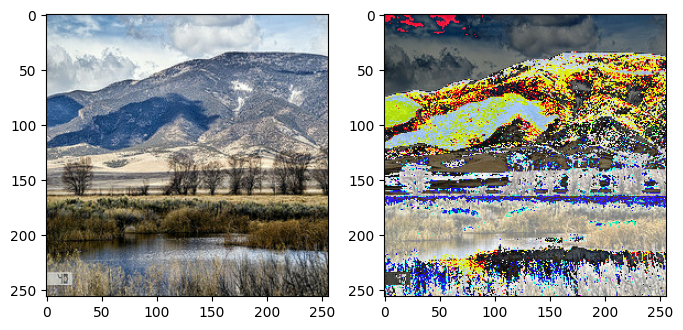

In [35]:
fig, axs = plt.subplots(1, 2, figsize=(8, 4))
prediction = monet_generator(next(iter(photo_ds)), training=False)[0].numpy()
prediction = (prediction * 127.5 + 127.5).astype(np.uint8)
axs[0].imshow(next(iter(photo_ds))[0]*.5+.5)
axs[1].imshow(prediction)

Now I will use LeakyReLU and ReLU activation functions for the generator.  These have been found to work well for this class of tasks.  

In [10]:
def Generator():
    initializer = tf.random_normal_initializer(0., 0.02)
    
    inputs = layers.Input(shape=[256, 256, 3])
    down_1 = Conv2D(64, 4, strides=2, padding='same', kernel_initializer=initializer, use_bias=False, activation="LeakyReLU")(inputs)
    down_2 = Conv2D(128, 4, strides=2, padding='same', kernel_initializer=initializer, use_bias=False, activation="LeakyReLU")(down_1)
    down_2_2 = Conv2D(256, 4, strides=2, padding='same', kernel_initializer=initializer, use_bias=False, activation="LeakyReLU")(down_2)    
    down_3 = Conv2D(512, 4, strides=2, padding='same', kernel_initializer=initializer, use_bias=False, activation="LeakyReLU")(down_2_2)
    down_4 = Conv2D(512, 4, strides=2, padding='same', kernel_initializer=initializer, use_bias=False, activation="LeakyReLU")(down_3)
    down_5 = Conv2D(512, 4, strides=2, padding='same', kernel_initializer=initializer, use_bias=False, activation="LeakyReLU")(down_4)
    down_6 = Conv2D(512, 4, strides=2, padding='same', kernel_initializer=initializer, use_bias=False, activation="LeakyReLU")(down_5)
    down_7 = Conv2D(512, 4, strides=2, padding='same', kernel_initializer=initializer, use_bias=False, activation="LeakyReLU")(down_6)    
    up_1 = Conv2DTranspose(512, 4, strides=2, padding='same', kernel_initializer=initializer, use_bias=False, activation="ReLU")(down_7)
    up_2 = add([Conv2DTranspose(512, 4, strides=2, padding='same', kernel_initializer=initializer, use_bias=False, activation="ReLU")(up_1), down_5])
    up_3 = add([Conv2DTranspose(512, 4, strides=2, padding='same', kernel_initializer=initializer, use_bias=False, activation="ReLU")(up_2), down_4])
    up_4 = add([Conv2DTranspose(512, 4, strides=2, padding='same', kernel_initializer=initializer, use_bias=False, activation="ReLU")(up_3), down_3])
    up_5 = add([Conv2DTranspose(256, 4, strides=2, padding='same', kernel_initializer=initializer, use_bias=False, activation="ReLU")(up_4), down_2_2])
    up_6 = add([Conv2DTranspose(128, 4, strides=2, padding='same', kernel_initializer=initializer, use_bias=False, activation="ReLU")(up_5), down_2])
    up_7 = add([Conv2DTranspose(64, 4, strides=2, padding='same', kernel_initializer=initializer, use_bias=False, activation="ReLU")(up_6), down_1])

    outputs = add([Conv2DTranspose(3, 4, strides=2, padding='same', kernel_initializer=initializer, activation='tanh')(up_7), inputs])

    return Model(inputs=inputs, outputs=outputs)


In [11]:
def Discriminator():
    initializer = tf.random_normal_initializer(0., 0.02)
    gamma_init = keras.initializers.RandomNormal(mean=0.0, stddev=0.02)

    inputs = layers.Input(shape=[256, 256, 3], name='input_image')
    down_1 = Conv2D(64, 4, strides=2, padding='same', kernel_initializer=initializer, use_bias=False, activation="LeakyReLU")(inputs)
    down_2 = Conv2D(128, 4, strides=2, padding='same', kernel_initializer=initializer, use_bias=False, activation="LeakyReLU")(down_1)
    down_3 = Conv2D(256, 4, strides=2, padding='same', kernel_initializer=initializer, use_bias=False, activation="LeakyReLU")(down_2)
    padding = layers.ZeroPadding2D()(down_3)
    conv2D = layers.Conv2D(512, 4, strides=1, kernel_initializer=initializer,use_bias=False)(padding) 
    norm1 = tfa.layers.InstanceNormalization(gamma_initializer=gamma_init)(conv2D)
    leaky_relu = layers.LeakyReLU()(norm1)
    padding2 = layers.ZeroPadding2D()(leaky_relu)
    outputs = layers.Conv2D(1, 4, strides=1, kernel_initializer=initializer)(padding2) 

    return Model(inputs=inputs, outputs=outputs)

In [13]:
monet_generator.summary()

Model: "model_4"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_3 (InputLayer)           [(None, 256, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d_26 (Conv2D)             (None, 128, 128, 64  3072        ['input_3[0][0]']                
                                )                                                                 
                                                                                                  
 conv2d_27 (Conv2D)             (None, 64, 64, 128)  131072      ['conv2d_26[0][0]']              
                                                                                            

In [14]:
monet_discriminator.summary()

Model: "model_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_image (InputLayer)    [(None, 256, 256, 3)]     0         
                                                                 
 conv2d_42 (Conv2D)          (None, 128, 128, 64)      3072      
                                                                 
 conv2d_43 (Conv2D)          (None, 64, 64, 128)       131072    
                                                                 
 conv2d_44 (Conv2D)          (None, 32, 32, 256)       524288    
                                                                 
 zero_padding2d_4 (ZeroPaddi  (None, 34, 34, 256)      0         
 ng2D)                                                           
                                                                 
 conv2d_45 (Conv2D)          (None, 31, 31, 512)       2097152   
                                                           

Now I will train for another 25 epochs.

In [55]:
cycle_gan_model.fit(
    tf.data.Dataset.zip((monet_ds, photo_ds)),
    epochs=25
)

checkpoint_monet.write(file_prefix = checkpoint_prefix_monet)
checkpoint_photo.write(file_prefix = checkpoint_prefix_photo)

Epoch 1/25


2023-08-12 19:52:39.567882: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] model_pruner failed: INVALID_ARGUMENT: Graph does not contain terminal node AssignAddVariableOp.
2023-08-12 19:52:39.946366: E tensorflow/core/grappler/optimizers/meta_optimizer.cc:954] model_pruner failed: INVALID_ARGUMENT: Graph does not contain terminal node AssignAddVariableOp.


300/300 [==============================] - 85s 106ms/step - monet_gen_loss: 0.8753 - photo_gen_loss: 0.8518 - monet_disc_loss: 0.6422 - photo_disc_loss: 0.6433
Epoch 2/25
300/300 [==============================] - 32s 106ms/step - monet_gen_loss: 1.2011 - photo_gen_loss: 1.2249 - monet_disc_loss: 0.5721 - photo_disc_loss: 0.5617
Epoch 3/25
300/300 [==============================] - 32s 106ms/step - monet_gen_loss: 1.2944 - photo_gen_loss: 1.3932 - monet_disc_loss: 0.5569 - photo_disc_loss: 0.5176
Epoch 4/25
300/300 [==============================] - 31s 105ms/step - monet_gen_loss: 1.4764 - photo_gen_loss: 1.5515 - monet_disc_loss: 0.5270 - photo_disc_loss: 0.4976
Epoch 5/25
300/300 [==============================] - 32s 106ms/step - monet_gen_loss: 1.5597 - photo_gen_loss: 1.7406 - monet_disc_loss: 0.5469 - photo_disc_loss: 0.4937
Epoch 6/25
300/300 [==============================] - 32s 105ms/step - monet_gen_loss: 1.6098 - photo_gen_loss: 1.7118 - monet_disc_loss: 0.5345 - photo_dis

'./checkpoints_cycle_photo/ckpt'

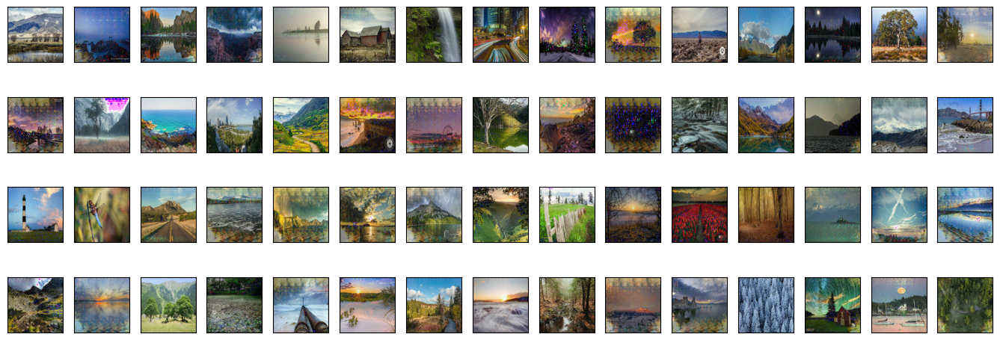

In [56]:
num_row = 4
num_col = 15
fig, axs = plt.subplots(num_row, num_col, figsize=(17, 6))
photo_pic = iter(photo_ds)
for i in range(num_row):
    for j in range(num_col):
        prediction = monet_generator(next(photo_pic), training=False)[0].numpy()
        prediction = (prediction * 127.5 + 127.5).astype(np.uint8)
        axs[i, j].imshow(prediction)
        axs[i, j].set_xticks([])
        axs[i, j].set_yticks([])

Some image differences are noticable in the transformed photos.  It feels like there is an extra layer over some of the sky features in the images which has changed the colors a bit.  There is also some pixelation occuring, which is unfortunate.  More training will be needed.

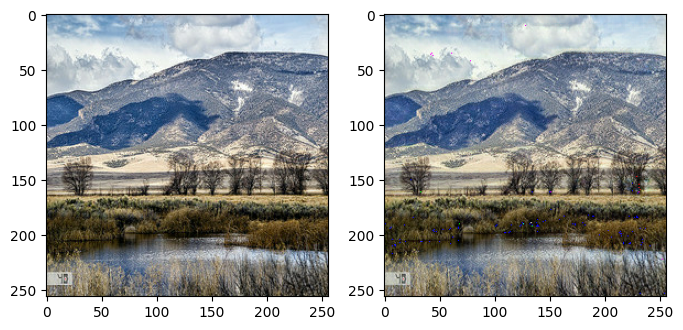

In [57]:
fig, axs = plt.subplots(1, 2, figsize=(8, 4))
prediction = monet_generator(next(iter(photo_ds)), training=False)[0].numpy()
prediction = (prediction * 127.5 + 127.5).astype(np.uint8)
axs[0].imshow(next(iter(photo_ds))[0]*.5+.5)
axs[1].imshow(prediction)

I will train for another 25 epochs.

In [58]:
cycle_gan_model.fit(
    tf.data.Dataset.zip((monet_ds, photo_ds)),
    epochs=25
)

checkpoint_monet.write(file_prefix = checkpoint_prefix_monet)
checkpoint_photo.write(file_prefix = checkpoint_prefix_photo)

Epoch 1/25
300/300 [==============================] - 32s 107ms/step - monet_gen_loss: 2.2433 - photo_gen_loss: 2.6210 - monet_disc_loss: 0.5380 - photo_disc_loss: 0.4345
Epoch 2/25
300/300 [==============================] - 32s 106ms/step - monet_gen_loss: 2.2253 - photo_gen_loss: 2.4811 - monet_disc_loss: 0.5328 - photo_disc_loss: 0.4558
Epoch 3/25
300/300 [==============================] - 32s 106ms/step - monet_gen_loss: 2.1669 - photo_gen_loss: 2.4743 - monet_disc_loss: 0.5595 - photo_disc_loss: 0.4545
Epoch 4/25
300/300 [==============================] - 32s 105ms/step - monet_gen_loss: 2.3326 - photo_gen_loss: 2.7137 - monet_disc_loss: 0.5275 - photo_disc_loss: 0.4274
Epoch 5/25
300/300 [==============================] - 32s 106ms/step - monet_gen_loss: 2.6206 - photo_gen_loss: 2.9913 - monet_disc_loss: 0.4735 - photo_disc_loss: 0.3893
Epoch 6/25
300/300 [==============================] - 32s 106ms/step - monet_gen_loss: 2.4009 - photo_gen_loss: 2.7831 - monet_disc_loss: 0.5021 

'./checkpoints_cycle_photo/ckpt'

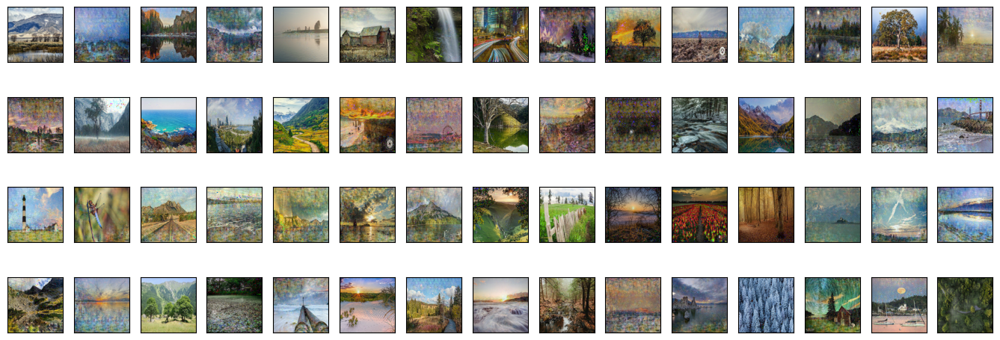

In [59]:
num_row = 4
num_col = 15
fig, axs = plt.subplots(num_row, num_col, figsize=(17, 6))
photo_pic = iter(photo_ds)
for i in range(num_row):
    for j in range(num_col):
        prediction = monet_generator(next(photo_pic), training=False)[0].numpy()
        prediction = (prediction * 127.5 + 127.5).astype(np.uint8)
        axs[i, j].imshow(prediction)
        axs[i, j].set_xticks([])
        axs[i, j].set_yticks([])

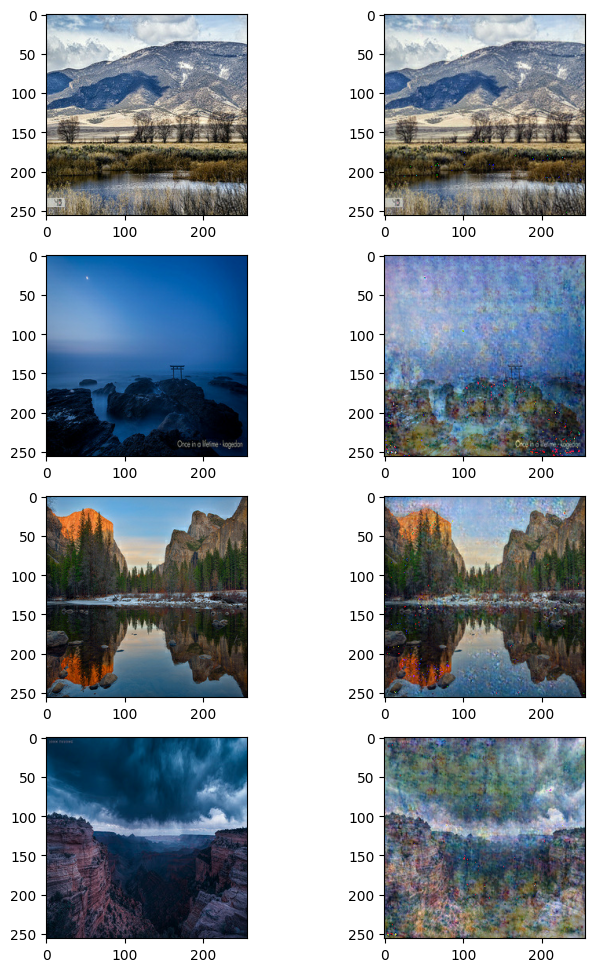

In [68]:
photo = iter(photo_ds)

fig, axs = plt.subplots(4, 2, figsize=(8, 12))
photo_1 = next(photo)
prediction = monet_generator(photo_1, training=False)[0].numpy()
prediction = (prediction * 127.5 + 127.5).astype(np.uint8)
axs[0,0].imshow(photo_1[0]*.5+.5)
axs[0,1].imshow(prediction)
photo_2 = next(photo)
prediction = monet_generator(photo_2, training=False)[0].numpy()
prediction = (prediction * 127.5 + 127.5).astype(np.uint8)
axs[1,0].imshow(photo_2[0]*.5+.5)
axs[1,1].imshow(prediction)
photo_3 = next(photo)
prediction = monet_generator(photo_3, training=False)[0].numpy()
prediction = (prediction * 127.5 + 127.5).astype(np.uint8)
axs[2,0].imshow(photo_3[0]*.5+.5)
axs[2,1].imshow(prediction)
photo_4 = next(photo)
prediction = monet_generator(photo_4, training=False)[0].numpy()
prediction = (prediction * 127.5 + 127.5).astype(np.uint8)
axs[3,0].imshow(photo_4[0]*.5+.5)
axs[3,1].imshow(prediction)

Here we can see more clearly the difference between the original and transformed images.  There is a lot of change in some images, but hardly any in the first image of the mountains.  The transformed photos do feel more painting like.  In particular, the color blending in the bottom image shows this feature.

I will run two more sets of 25 epochs to see if further changes are possible.  

In [69]:
cycle_gan_model.fit(
    tf.data.Dataset.zip((monet_ds, photo_ds)),
    epochs=25
)

checkpoint_monet.save(file_prefix = checkpoint_prefix_monet)
checkpoint_photo.save(file_prefix = checkpoint_prefix_photo)

Epoch 1/25
300/300 [==============================] - 32s 107ms/step - monet_gen_loss: 2.9938 - photo_gen_loss: 3.8518 - monet_disc_loss: 0.4807 - photo_disc_loss: 0.2989
Epoch 2/25
300/300 [==============================] - 32s 105ms/step - monet_gen_loss: 3.1074 - photo_gen_loss: 3.8390 - monet_disc_loss: 0.4408 - photo_disc_loss: 0.2903
Epoch 3/25
300/300 [==============================] - 32s 105ms/step - monet_gen_loss: 2.9264 - photo_gen_loss: 3.5961 - monet_disc_loss: 0.5020 - photo_disc_loss: 0.3355
Epoch 4/25
300/300 [==============================] - 32s 106ms/step - monet_gen_loss: 2.8531 - photo_gen_loss: 3.5340 - monet_disc_loss: 0.5209 - photo_disc_loss: 0.3445
Epoch 5/25
300/300 [==============================] - 32s 107ms/step - monet_gen_loss: 2.8504 - photo_gen_loss: 3.4887 - monet_disc_loss: 0.5317 - photo_disc_loss: 0.3620
Epoch 6/25
300/300 [==============================] - 32s 106ms/step - monet_gen_loss: 2.8609 - photo_gen_loss: 3.6179 - monet_disc_loss: 0.5353 

'./checkpoints_cycle_photo/ckpt-1'

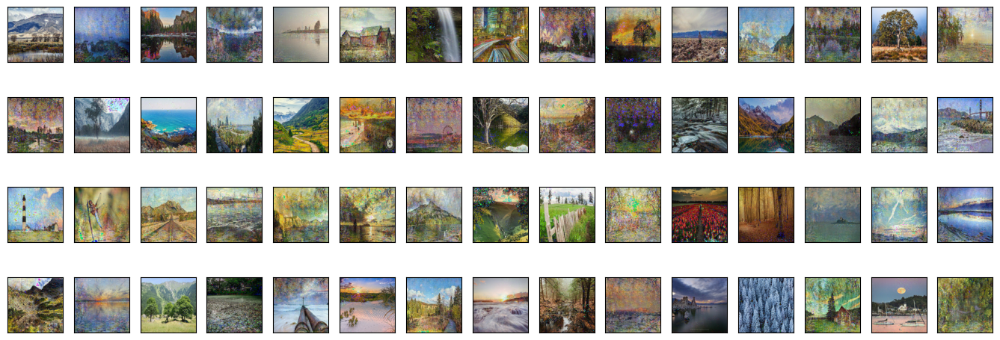

In [70]:
num_row = 4
num_col = 15
fig, axs = plt.subplots(num_row, num_col, figsize=(17, 6))
photo_pic = iter(photo_ds)
for i in range(num_row):
    for j in range(num_col):
        prediction = monet_generator(next(photo_pic), training=False)[0].numpy()
        prediction = (prediction * 127.5 + 127.5).astype(np.uint8)
        axs[i, j].imshow(prediction)
        axs[i, j].set_xticks([])
        axs[i, j].set_yticks([])

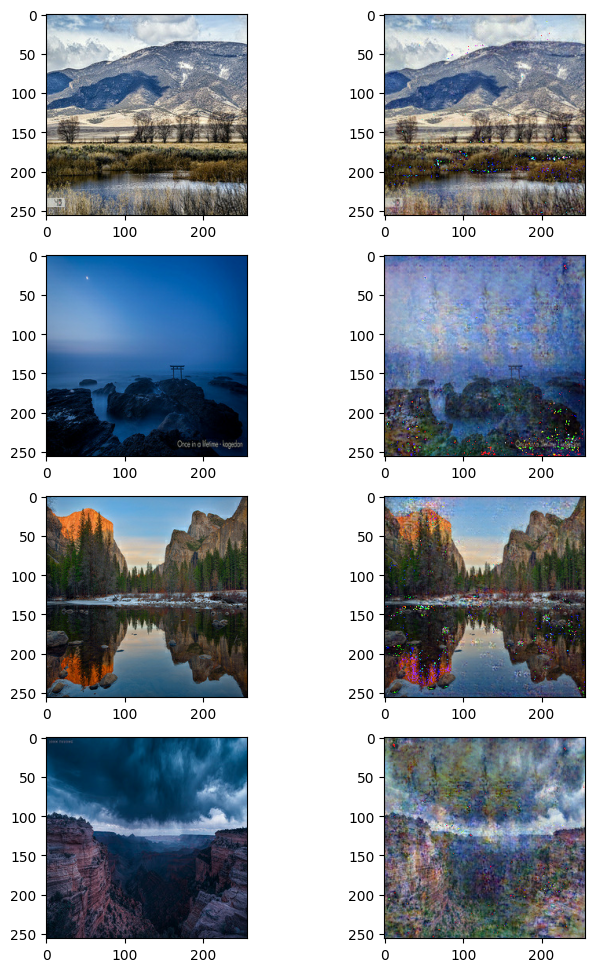

In [71]:
photo = iter(photo_ds)

fig, axs = plt.subplots(4, 2, figsize=(8, 12))
photo_1 = next(photo)
prediction = monet_generator(photo_1, training=False)[0].numpy()
prediction = (prediction * 127.5 + 127.5).astype(np.uint8)
axs[0,0].imshow(photo_1[0]*.5+.5)
axs[0,1].imshow(prediction)
photo_2 = next(photo)
prediction = monet_generator(photo_2, training=False)[0].numpy()
prediction = (prediction * 127.5 + 127.5).astype(np.uint8)
axs[1,0].imshow(photo_2[0]*.5+.5)
axs[1,1].imshow(prediction)
photo_3 = next(photo)
prediction = monet_generator(photo_3, training=False)[0].numpy()
prediction = (prediction * 127.5 + 127.5).astype(np.uint8)
axs[2,0].imshow(photo_3[0]*.5+.5)
axs[2,1].imshow(prediction)
photo_4 = next(photo)
prediction = monet_generator(photo_4, training=False)[0].numpy()
prediction = (prediction * 127.5 + 127.5).astype(np.uint8)
axs[3,0].imshow(photo_4[0]*.5+.5)
axs[3,1].imshow(prediction)

In [72]:
cycle_gan_model.fit(
    tf.data.Dataset.zip((monet_ds, photo_ds)),
    epochs=25
)

checkpoint_monet.save(file_prefix = checkpoint_prefix_monet)
checkpoint_photo.save(file_prefix = checkpoint_prefix_photo)

Epoch 1/25
300/300 [==============================] - 32s 105ms/step - monet_gen_loss: 3.1133 - photo_gen_loss: 3.4735 - monet_disc_loss: 0.4490 - photo_disc_loss: 0.3698
Epoch 2/25
300/300 [==============================] - 32s 106ms/step - monet_gen_loss: 3.0529 - photo_gen_loss: 3.4911 - monet_disc_loss: 0.4641 - photo_disc_loss: 0.3682
Epoch 3/25
300/300 [==============================] - 32s 107ms/step - monet_gen_loss: 3.0047 - photo_gen_loss: 3.4048 - monet_disc_loss: 0.4791 - photo_disc_loss: 0.3817
Epoch 4/25
300/300 [==============================] - 32s 107ms/step - monet_gen_loss: 3.0435 - photo_gen_loss: 3.4652 - monet_disc_loss: 0.4789 - photo_disc_loss: 0.3636
Epoch 5/25
300/300 [==============================] - 32s 106ms/step - monet_gen_loss: 3.0423 - photo_gen_loss: 3.4549 - monet_disc_loss: 0.4757 - photo_disc_loss: 0.3638
Epoch 6/25
300/300 [==============================] - 32s 106ms/step - monet_gen_loss: 3.0711 - photo_gen_loss: 3.5031 - monet_disc_loss: 0.4784 

'./checkpoints_cycle_photo/ckpt-2'

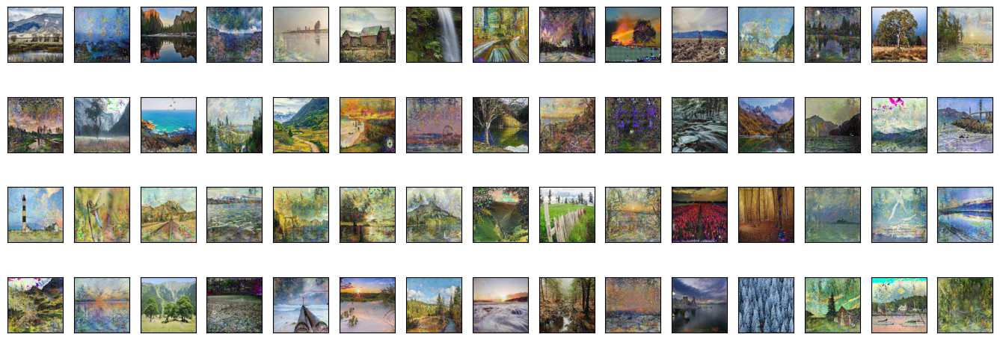

In [73]:
num_row = 4
num_col = 15
fig, axs = plt.subplots(num_row, num_col, figsize=(17, 6))
photo_pic = iter(photo_ds)
for i in range(num_row):
    for j in range(num_col):
        prediction = monet_generator(next(photo_pic), training=False)[0].numpy()
        prediction = (prediction * 127.5 + 127.5).astype(np.uint8)
        axs[i, j].imshow(prediction)
        axs[i, j].set_xticks([])
        axs[i, j].set_yticks([])

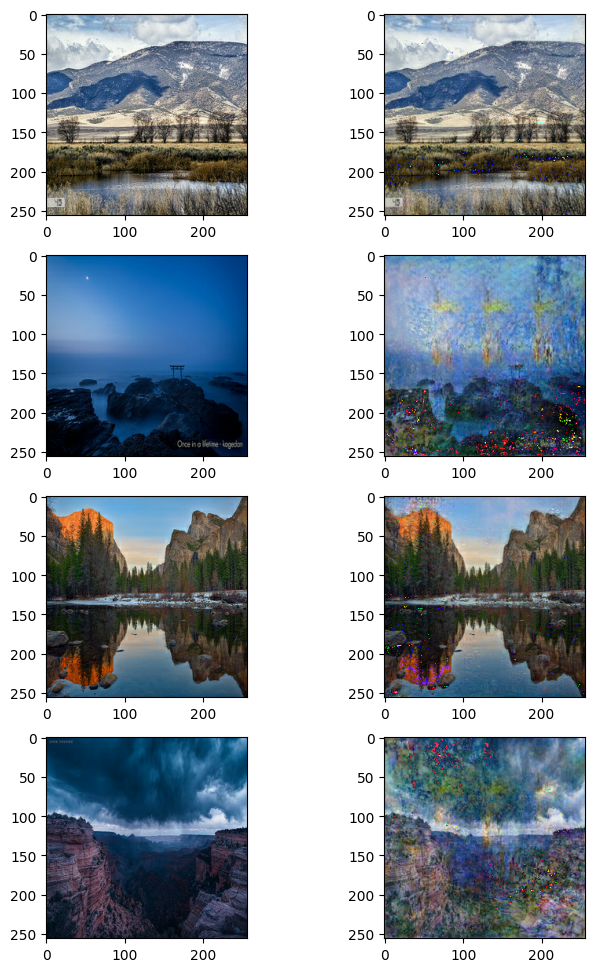

In [74]:
photo = iter(photo_ds)

fig, axs = plt.subplots(4, 2, figsize=(8, 12))
photo_1 = next(photo)
prediction = monet_generator(photo_1, training=False)[0].numpy()
prediction = (prediction * 127.5 + 127.5).astype(np.uint8)
axs[0,0].imshow(photo_1[0]*.5+.5)
axs[0,1].imshow(prediction)
photo_2 = next(photo)
prediction = monet_generator(photo_2, training=False)[0].numpy()
prediction = (prediction * 127.5 + 127.5).astype(np.uint8)
axs[1,0].imshow(photo_2[0]*.5+.5)
axs[1,1].imshow(prediction)
photo_3 = next(photo)
prediction = monet_generator(photo_3, training=False)[0].numpy()
prediction = (prediction * 127.5 + 127.5).astype(np.uint8)
axs[2,0].imshow(photo_3[0]*.5+.5)
axs[2,1].imshow(prediction)
photo_4 = next(photo)
prediction = monet_generator(photo_4, training=False)[0].numpy()
prediction = (prediction * 127.5 + 127.5).astype(np.uint8)
axs[3,0].imshow(photo_4[0]*.5+.5)
axs[3,1].imshow(prediction)

After 50 epochs, the quality of the transformed images seemed to deteriorate.  There is also more anamolous pixelation, and the changed colors are more distracting than artful.  I will attempt to submit 7,000 images based on the performance after 75 epochs

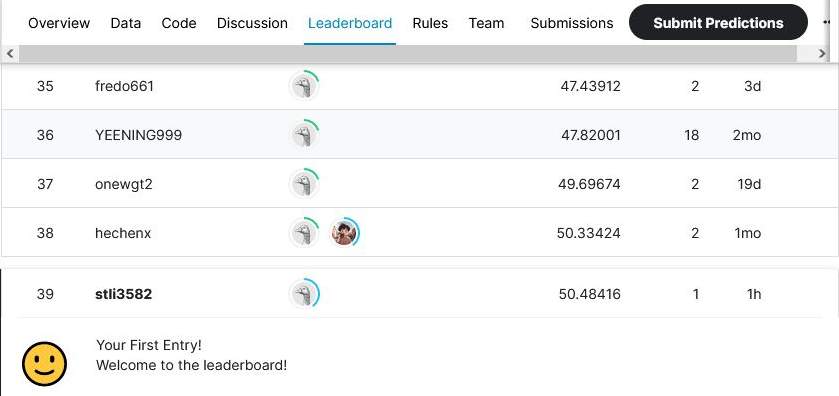

# Analysis and Discussion

|Model|Parameters|Epochs|Training Time|Accelerator|
|:----|:--------:|:--------:|:--------:|:--------:|
|DCGAN | 5.7m | 100 | ~5.3h |GPU|
|CycleGAN | 83.4m | 100 | ~0.8h |TPU|


There is no standard quantitative score that is used to measure the performance of GANs; therefore, a much more qualitative approach needs to be taken to evaluate results.  Thus, we will use manual inspection of the images as our core metric.

Since the DCGAN model attempts to create the entire image from noise, it was able to mimic some of the sylistic aspects of Monet's paintings.  For instance, the images that the model rendered featured colors similar to the Monet paintings and a similar way of blending colors.  However, with the training performed, it was not able to render structures.  Rather, the images were more like mix of colors.  I believe that this is to be expected.  There are only 300 images on which to train the model.  If we wanted to render a structure like a haystack, we would likely need to feed the model many images of haystacks.  Also, since all of the paintings were of different objects, it likely confused the model.  

On the other hand, the CycleGAN style-tranfer created images that retained the existing objects and structures of the original image.  Thus, the images were much more recognizable.  The CycleGAN model also learned about Monet's color choices and was able to apply those to the images.  But, I am surprised that the images did not take on a more painting-like quality.  The rendered images really don't look like paintings.  They just look like a filter has been applied over the photos.  I was also disappointed to see the pixelation taking place in the rendered images.  I am not sure why that occured.  

Overall, I believe that the CycleGAN model performed better for this task, but it is likely that both could be more finely tuned to increase performance.

I learned much from this project. First, when training is so time-consuming, it pays to double check your work.  I was overly-eager to start training, and I made mistakes that impacted results and necessitated re-work.  For instance, with DCGAN I neglected to think about the best batch sizes to use, and I did not think about what noise sizes would be best suited to this task.  That resulted in many hours of wasted training time.  Similarly, with the CycleGAN model, I made a silly mistake of omiting activation functions.  Luckily, the training time with the TPU was not as long as DCGAN.

Another place of learning for this project was the importance of leveraging TPUs.  I did use a GPU for the DCGAN model; but I doubt that it made much of a difference.  However, training the CycleGAN model with several times as many parameters as the DCGAN was accomplished much more quickly using the TPU.  I did initially attempt to use the TPU for the DCGAN model, but I was unable to sucessfully train with it.  I need to do more research about how to use the TPU.   

If I were to re-work this project, I would spend more time on how to make sure that the generators and discriminators are in a proper balance.  If one of them is too strong compared to the other, it can prevent learning.  I found the following website to be particularly helpful: https://www.mathworks.com/help/deeplearning/ug/monitor-gan-training-progress-and-identify-common-failure-modes.html.  It explains common failures for GANs and how to address them.  



# References
>https://www.kaggle.com/code/amyjang/monet-cyclegan-tutorial/notebook

>https://www.tensorflow.org/tutorials/generative/dcgan

>https://www.mathworks.com/help/deeplearning/ug/monitor-gan-training-progress-and-identify-common-failure-modes.html

>https://pytorch.org/tutorials/beginner/dcgan_faces_tutorial.html

>https://blog.jaysinha.me/train-your-first-cyclegan-for-image-to-image-translation/